# Procesamiendo de Imagenes
## Trabajo Practico nº 2

GRUPO:
Nicolas Eric Ponce
nicoponce86@gmail.com

Edgardo Garrigo (you)
egarrigo@gmail.com

Ivan Fabio Gutierrez
ivan.fabio.gutierrez@gmail.com

In [ ]:
from ipywidgets import widgets as wg
from IPython.display  import clear_output, display
from tkinter import Tk, filedialog

import panel as pn
import panel.interact as interact
pn.extension()

import cv2
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
import requests
from io import BytesIO

from matplotlib.pyplot import imshow

from tkinter.filedialog import askopenfilename

import math

import scipy.stats as st



In [ ]:
def resume_path(path, length = 50):
    index = len(path) - length    
    return f'...{path[index:]}'




##############################################################
##############################################################
##############################################################

def Graficar(Original, final):
    
    plt.figure(figsize=(20,20))
        
    if (img.mode == 'L'):
        
        plt.subplot(121)
        plt.title('Original')
        plt.imshow(np.array(Original), cmap = 'gray')

        plt.subplot(122)
        plt.title('Procesada')
        plt.imshow(np.array(final), cmap = 'gray')
    else:
        
        plt.subplot(121)
        plt.title('Original')
        plt.imshow(np.array(Original))

        plt.subplot(122)
        plt.title('Procesada')
        plt.imshow(np.array(final))



###############################################################
# Parte 1
#Filtro Pasabajo
###############################################################


##
#Pasabajo Llano
##

def Pasabajos_Llano(PBL, nivel):

    kernel = np.ones((3,3))
    kernel = nivel * kernel
    aux = 0        
    w, he = np.shape(PBL)
    PBL_filtrado = PBL.copy()

    
    for i in range(1,w-1):
        for j in range(1,he-1):
            for ik in range(0,3):
                for jk in range(0,3):
                    aux = aux + PBL[i+ik-1,j+jk-1] * kernel[ik,jk]
        PBL_filtrado[i,j] = aux       
                
                 
    return PBL_filtrado

##
# Pasabajo Barlet 3x3
##

def Barlett(BLT):

    kernelB = np.array([[1/16, 2/16, 1/16], [2/16, 4/16, 2/16], [1/16, 2/16, 1/16]])
   
    aux = 0        
    w, he = np.shape(BLT)
    BLT_filtrado = BLT.copy()
   # BLT_filtrado.setflags(write=1)

    
    for i in range(1,w-1):
        for j in range(1,he-1):
            for ik in range(0,3):
                for jk in range(0,3):
                    aux = aux + BLT[(i+ik-1),(j+jk-1)] * kernelB[ik,jk]
            BLT_filtrado[i,j] = aux 
            #print(i,j,aux)
            aux = 0
                
                 
    return BLT_filtrado


##
# Pasabajo Gaussiano 5x5
##

def Gausiano(Gaus):

    kernelG = np.array([[1/256, 4/256, 6/256,  4/256, 1/256],
                        [4/256, 16/256,  24/256, 16/256, 4/256],
                        [6/256,  24/256, 36/256, 24/256,  6/256],
                        [4/256, 16/256,  24/256, 16/256, 4/256],
                        [1/256, 4/256, 6/256,  4/256, 1/256]                       
                       ])
   
    aux = 0        
    w, he = np.shape(Gaus)
    GAU_filtrado = Gaus.copy()

    
    for i in range(1,w-2):
        for j in range(1,he-2):
            for ik in range(0,5):
                for jk in range(0,5):
                    aux = aux + Gaus[(i+ik-2),(j+jk-2)] * kernelG[ik,jk]
            GAU_filtrado[i,j] = aux 
            #print(i,j,aux)
            aux = 0
                
                 
    return GAU_filtrado

###############################################################
# Parte 2
# Detectores de Borde
###############################################################

##
# LAPLACIANO 4
##
def LAPLACIANO4(LP4):

    kernelLP4 = np.array([[0, -1, 0],
                          [-1, 4, -1], 
                          [0, -1, 0]])
   
    aux = 0        
    w, he = np.shape(LP4)
    LP4_filtrado = LP4.copy()

    
    for i in range(1,w-1):
        for j in range(1,he-1):
            for ik in range(0,3):
                for jk in range(0,3):
                    aux = aux + LP4[(i+ik-1),(j+jk-1)] * kernelLP4[ik,jk]
                   
            LP4_filtrado[i,j] = aux 
            aux = 0
                
                 
    return LP4_filtrado


##
# LAPLACIANO 8
##
def LAPLACIANO8(LP8):

    kernelLP8 = np.array([[-1, -1, -1],
                          [-1, 8, -1], 
                          [-1, -1, -1]])
   
    aux = 0        
    w, he = np.shape(LP8)
    LP8_filtrado = LP8.copy()

    
    for i in range(1,w-1):
        for j in range(1,he-1):
            for ik in range(0,3):
                for jk in range(0,3):
                    aux = aux + LP8[(i+ik-1),(j+jk-1)] * kernelLP8[ik,jk]
                    
            LP8_filtrado[i,j] = aux 
            aux = 0
    return LP8_filtrado

##
# SOBEL Orientacion OESTE
##
def SOeste(SO):

    kernelSO = np.array([[-1, 0, 1],
                          [-2, 0, 2], 
                          [-1, 0, 1]])

    aux = 0        
    w, he = np.shape(SO)
    SO_filtrado = SO.copy()

    
    for i in range(1,w-1):
        for j in range(1,he-1):
            for ik in range(0,3):
                for jk in range(0,3):
                    aux = aux + SO[(i+ik-1),(j+jk-1)] * kernelSO[ik,jk]
            SO_filtrado[i,j] = aux 
            aux = 0
                
                 
    return SO_filtrado

##
# SOBEL Orientacion SUR
##
def SSur(SS):

    kernelSS = np.array([[1, 2, 1],
                         [0, 0, 0], 
                         [-1, -2, -1]])

    aux = 0        
    w, he = np.shape(SS)
    SS_filtrado = SS.copy()

    
    for i in range(1,w-1):
        for j in range(1,he-1):
            for ik in range(0,3):
                for jk in range(0,3):
                    aux = aux + SS[(i+ik-1),(j+jk-1)] * kernelSS[ik,jk]
            SS_filtrado[i,j] = aux 
            aux = 0
                
                 
    return SS_filtrado


##
## Devuelve un Kernel Gaussiano 2D
## de longitud kernelen
## y sigma nsig
##
def gkern(kernlen, nsig):
       interval = (2*nsig+1.)/(kernlen)
       x = np.linspace(-nsig-interval/2., nsig+interval/2., kernlen+1)
       kern1d = np.diff(st.norm.cdf(x))
       kernel_raw = np.sqrt(np.outer(kern1d, kern1d))
       kernel = kernel_raw/kernel_raw.sum()
       return kernel

##
## Implementa el Filtro pasabanda Diferencia de Gaussianas
##

def DOG(DOGaus, sigma1, sigma2):
    #sigma1 = 1
    kernel1 = gkern(5,sigma1)
   
    #sigma2 = 10
    kernel2 = gkern(5,sigma2)

    kernel22 = kernel2-kernel1

    aux = 0        
    w, he = np.shape(DOGaus)
    DIF_DOG = DOGaus.copy()
  
    for i in range(1,w-2):
        for j in range(1,he-2):
            for ik in range(0,5):
                for jk in range(0,5):
                    aux = aux + DOGaus[(i+ik-2),(j+jk-2)] * kernel22[ik,jk]
            DIF_DOG[i,j] = aux 
            aux = 0            
    
           
    return DIF_DOG

# Ejercicio 2.1

Implementar un aplicativo o notebook que levante una imagen en nivel de gris (o que la convierta a YIQy retenga solo el Y) y aplique el filtrado por convolución aquí visto:

1. Pasabajos: Plano, Bartlett 3x3, Gaussiano 5x5. 
2. Detectores de bordes: Laplacianov4, Sobel4 orientaciones.
3. Pasabanda.

Se implemento para imagenes en escala de grises

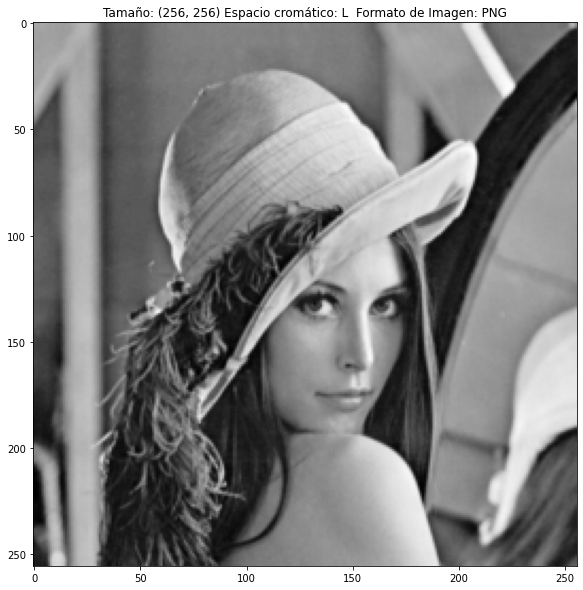

In [ ]:
img_url =  'https://i.stack.imgur.com/QCaSg.png'
response = requests.get(img_url)
img = Image.open(BytesIO(response.content))
img_byn = np.asarray(img)

plt.figure(figsize=(10,10))
plt.title('Tamaño: %s Espacio cromático: %s  Formato de Imagen: %s' % (str(img.size), str(img.mode), str(img.format)))
plt.imshow(img, cmap = 'gray')
plt.show()


## Ejericio 2.1
### 2.1.1 Pasabajos 

Pasabajo PLANO

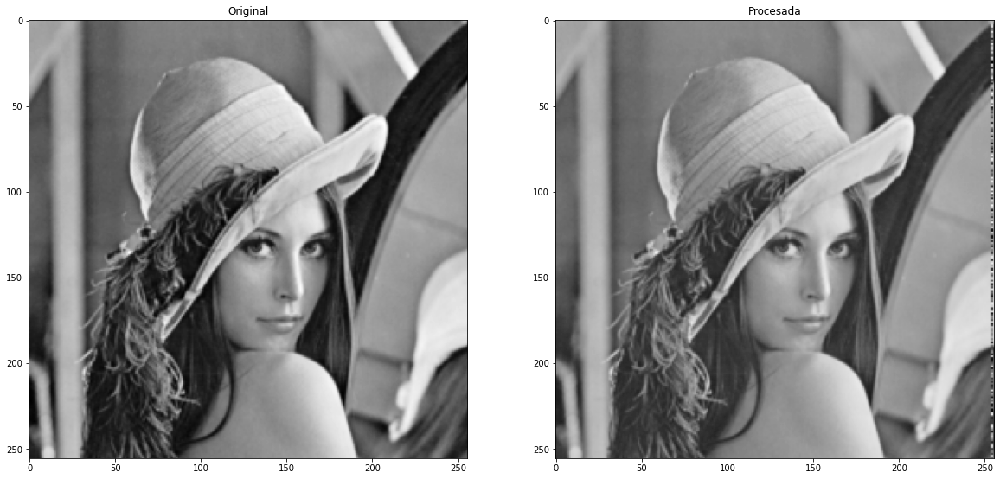

In [ ]:
lvl = 2
I_plan = Pasabajos_Llano(img_byn,lvl)
Graficar(img_byn, I_plan)


Pasabajos BARLETT


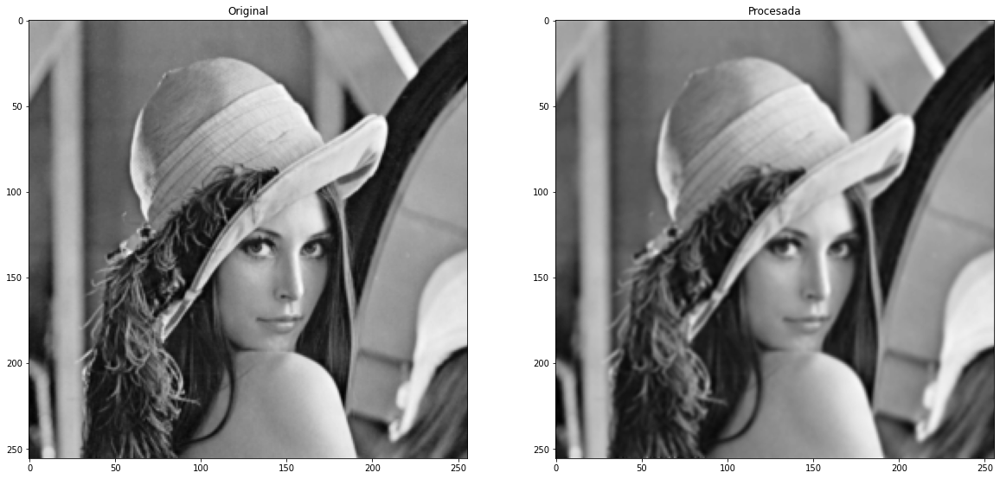

In [ ]:
I_BAR = Barlett(img_byn)
Graficar(img_byn, I_BAR)

Pasabajos GAUSSIANO

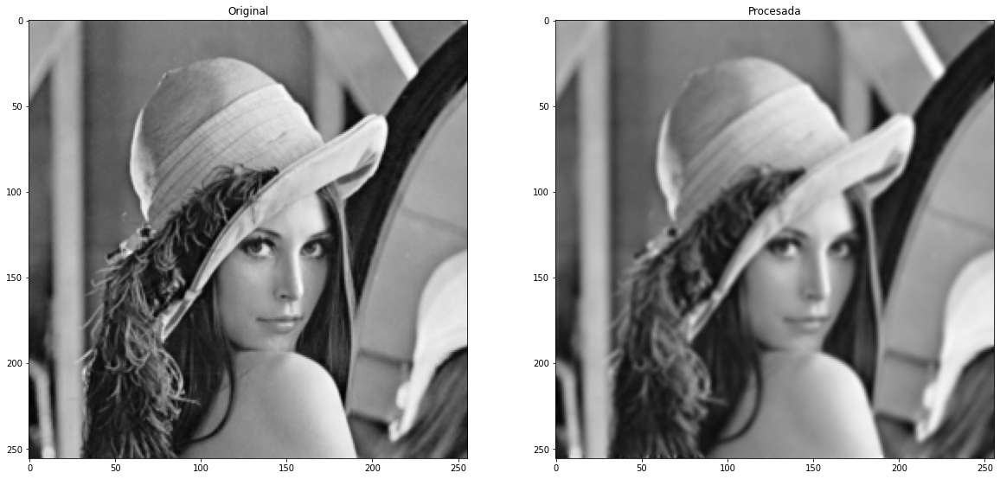

In [ ]:
I_GAU = Gausiano(img_byn)
Graficar(img_byn, I_GAU)

## Ejercicio 2.1
### 2.1.2 Detectores de Borde

LAPLACIANO v4

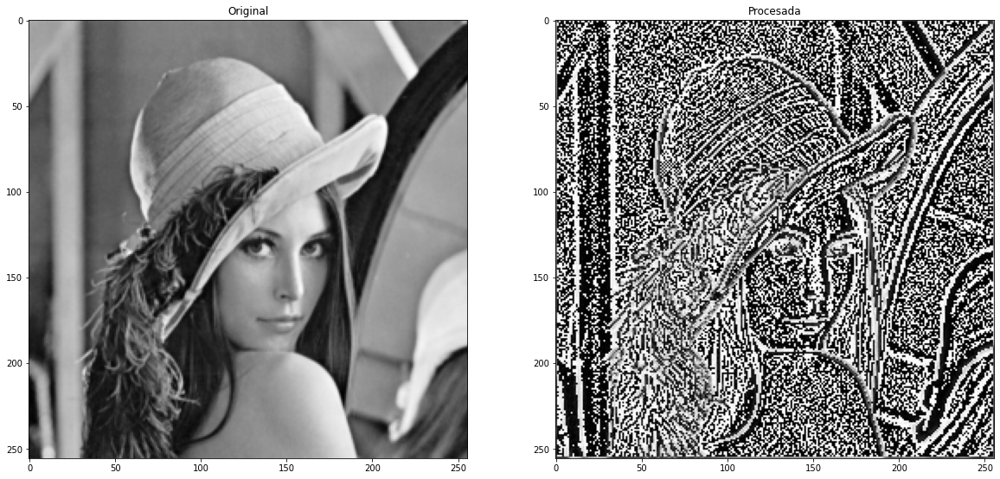

In [ ]:
I_L4 = LAPLACIANO4(img_byn)
Graficar(img_byn, I_L4)

LAPLACIANO v8

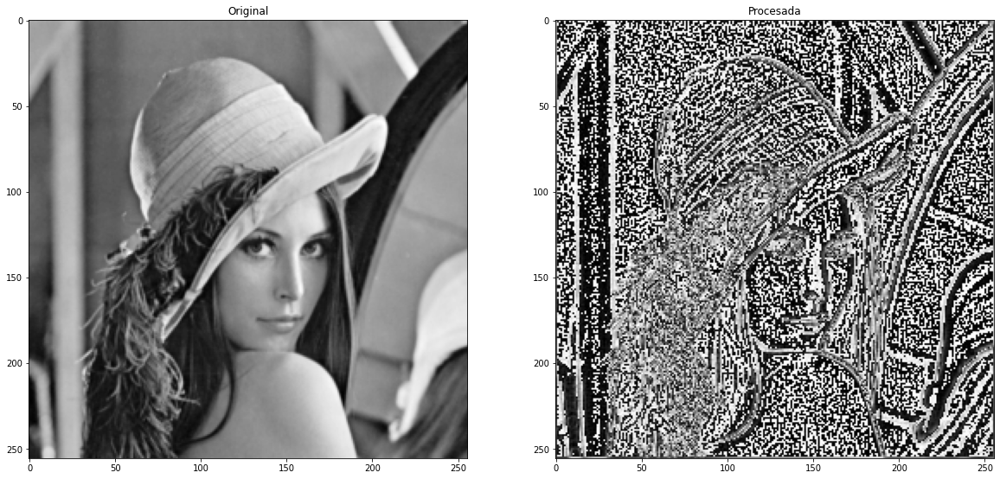

In [ ]:
I_L8 = LAPLACIANO8(img_byn)
Graficar(img_byn, I_L8)

SOBEL Orientaciones

OESTE

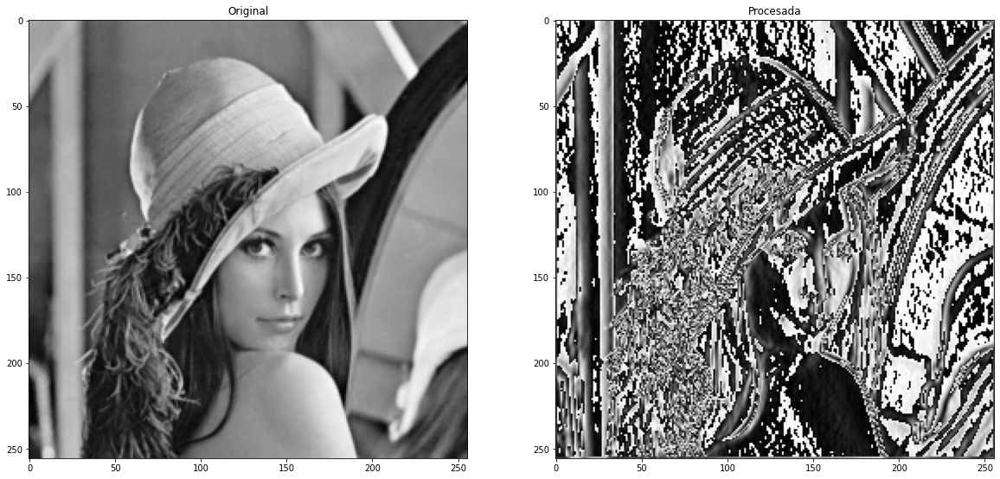

In [ ]:
I_SO = SOeste(img_byn)
Graficar(img_byn, I_SO)

SUR

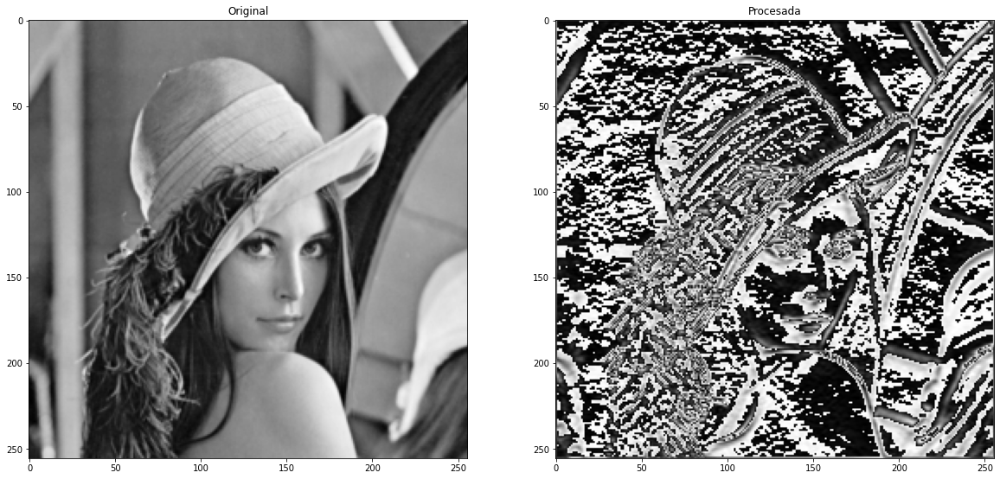

In [ ]:
I_SS = SSur(img_byn)
Graficar(img_byn, I_SS)

## Ejercicio 2.1
### 2.1.3 Pasabandas

Diferencia de Gaussianas (DOG)


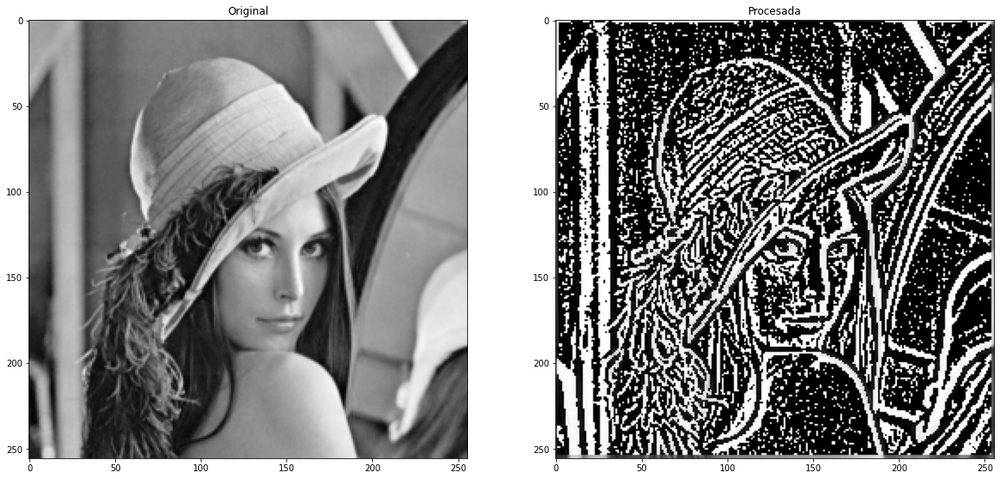

In [ ]:
# Los parametros de la funcion DOG son:
# DOG(ImagenOriginal, Sigma1, Sigma2) Donde Sigma es el sigma de la Gaussiana respectiva

I_DOG = DOG(img_byn,10,1)
Graficar(img_byn, I_DOG)

#Ejercicio 2.2: Porcesamiento morfológico
Desarrollar un aplicativo o notebook que implemente los conceptos de morfología en 
niveles de gris aquí descriptos, con un elemento estructurante 3x3. El mismo incluirá las 
siguientes funciones:
- Erosión (tomar el mínimo valor de luminancia de la vecindad).
- Dilatación (máximo)
- Apertura, cierre, borde morfológico
- Mediana 
- Top-hat

#Procesamiento para imagenes binarias

1.Erosion

2.Dilatacion



## Funciones

In [ ]:
#Binarizacion de imagenes, si es necesario.
def binarizacion (imagen):
  thres, img_bin = cv2.threshold(imagen, 128, 255, cv2.THRESH_BINARY) # todo lo que este por arriba de 128 será 255, por debajo 0.
  Image.fromarray(np.uint8(img_bin)).save('img_binarizada.png')
  return img_bin

In [ ]:
#imagen=nombre, extra=numero de columnas y filas extra a agregar, valorextra=el valor en esas filas y columnas
def add_padding(imagen, extra, valorextra): 
    return cv2.copyMakeBorder(imagen, extra, extra, extra, extra, cv2.BORDER_CONSTANT, value=valorextra)

In [ ]:
def operacion(image, kernel, padding=0, operacion=None):
    if operacion:
        img_operated = image.copy() 

        padding_value = 0           
        if operacion == "erosion":  
            padding_value = 1       
        padded = add_padding(image, padding, padding_value)  

        vertical_window = padded.shape[0] - kernel.shape[0] #num de mov vertical del kernel en la imagen+pad
        horizontal_window = padded.shape[1] - kernel.shape[1] #num de mov horizontal del kernel en la imagen+pad
        #print(vertical_window,horizontal_window)

        #posicionamos el kernet en 0 
        vertical_pos = 0
           
        while vertical_pos <= vertical_window: #luego se desplaza vertical
            horizontal_pos = 0
                     
            while horizontal_pos <= horizontal_window: #primero se desplaza horizontal
                dilation_flag = False
                erosion_flag = False

                #gives the index position of the box
                for i in range(kernel.shape[0]):      
                    for j in range(kernel.shape[1]):  
                        if kernel[i][j] == 1: #esta linea es en caso que se use un kernel cuyos valores no son solo 1         
                            #Erosion
                            if operacion == "erosion":
                                if padded[vertical_pos+i][horizontal_pos+j] == 0:  #Si encontramos un 0 en algun lugar de la imagen, debemos expandir el 0. 
                                    erosion_flag = True                            
                                    break
                            #Dilatacion
                            elif operacion == "dilatacion":
                                if padded[vertical_pos+i][horizontal_pos+j] == 255:  ##Si encontramos un 1 en algun lugar de la imagen, debemos expandir el 1.
                                    dilation_flag = True
                                    break
                            else:
                                return  "debe ingresar operacion: erosion o dilatacion"

                    #if opertion is erosion and there is no match found, break the first 'for' loop
                    if operacion == "erosion" and erosion_flag:         #Erosion
                        img_operated[vertical_pos, horizontal_pos] = 0      #Expandimos el 0
                        break

                    #if operation is dilation and we find a match, then break the first 'for' loop 
                    if operacion == "dilatacion" and dilation_flag:       #Dilatacion
                        img_operated[vertical_pos, horizontal_pos] = 255   #Expandimos el 1
                        break

                #Nos movemos horizontal
                horizontal_pos += 1

            #Nos movemos vertical
            vertical_pos += 1

        return img_operated

    return "debe ingresar operacion: 'erosion' o 'dilatacion'"

In [ ]:
#elemento estructurante 3x3

kernel = np.array ([[1, 1, 1],
                    [1, 1, 1],
                    [1, 1, 1]], dtype = np.uint8)


Hacemos a la imagen binaria (0, 255)

In [ ]:
img_bin=binarizacion(img_byn) #binarizo la img que venimos trabajando en este ejercicio 2
img_bin #notar que queda guardada como png

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255,   0],
       ...,
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0]], dtype=uint8)

Erosion de imagen binaria

In [ ]:
#1.Erosion
e_img_bin=operacion(img_bin, kernel, 1, 'erosion') 
e_img_bin

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255,   0,   0],
       [255, 255, 255, ...,   0,   0,   0],
       ...,
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0]], dtype=uint8)

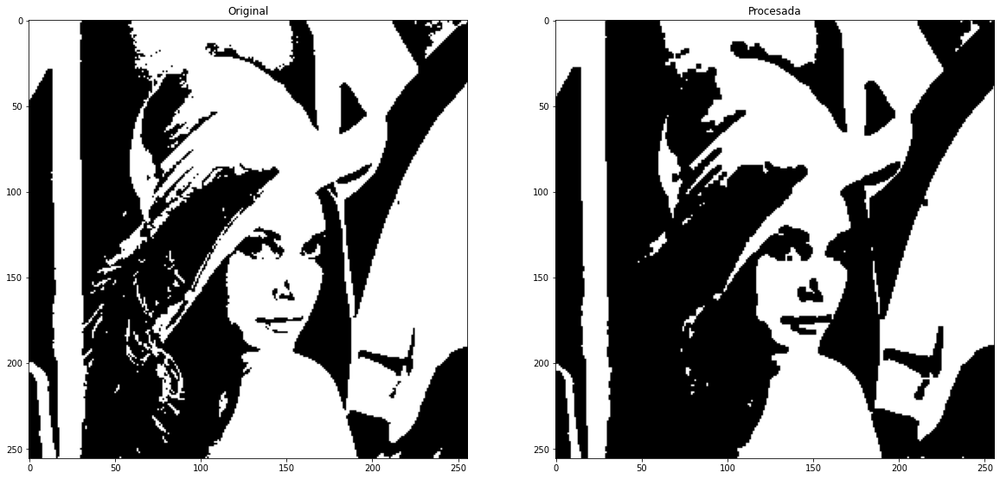

In [ ]:
Graficar(img_bin, e_img_bin)
#lo corrobore con cv2.erode y obtenemos la misma erosion

Dilatacion de imagen binaria

In [ ]:
#2. Dilatacion
d_img_bin=operacion(img_bin, kernel, 1, 'dilatacion')
d_img_bin

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0]], dtype=uint8)

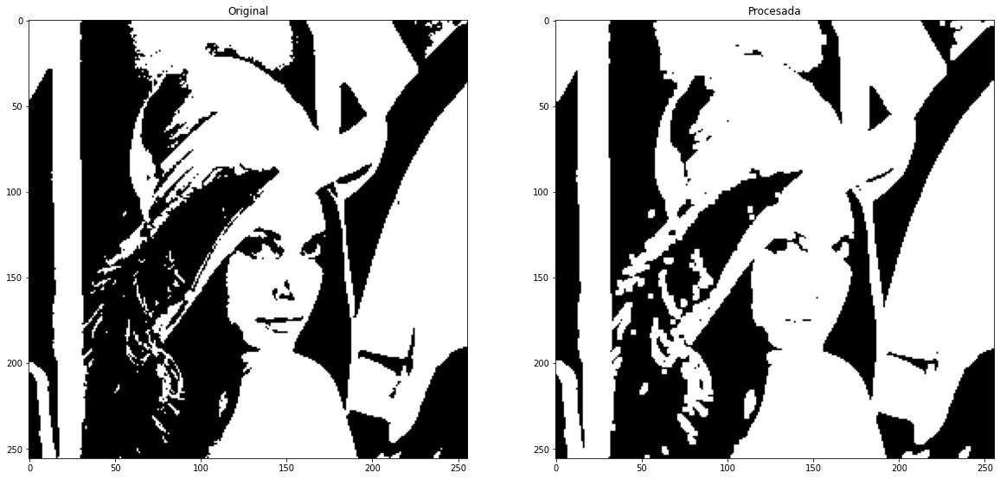

In [ ]:
Graficar(img_bin, d_img_bin) #chequeo


# Procesamiento para imagenes en escala de grises
1.Erosion: toma el mínimo valor de los vecinos.

2.Dilatacion: toma el maximo valor de los vecinos.

##Funciones

In [ ]:
def erosion(image, padding=0):
  img_operated = image.copy()
  kernel = np.array ([[1, 1, 1],
                    [1, 1, 1],
                    [1, 1, 1]], dtype = np.uint8)

  padded = add_padding(image, padding, 255)  
  vertical_window = padded.shape[0] - kernel.shape[0] #num de mov vertical del kernel en la imagen+pad
  horizontal_window = padded.shape[1] - kernel.shape[1] #num de mov horizontal del kernel en la imagen+pad
  
  #posicionamos el kernel en 0 
  vertical_pos = 0

  while vertical_pos <= vertical_window: #luego se desplaza vertical
    horizontal_pos = 0
    while horizontal_pos <= horizontal_window: #primero se desplaza horizontal
      
      for i in range(kernel.shape[0]):      
        for j in range(kernel.shape[1]):  
          if kernel[i][j] == 1: #esta linea es en caso que se use un kernel cuyos valores no son solo 1         
            if padded[vertical_pos+i][horizontal_pos+j] < img_operated[vertical_pos, horizontal_pos]:
              img_operated[vertical_pos, horizontal_pos] = padded[vertical_pos+i][horizontal_pos+j]
              continue
            elif padded[vertical_pos+i][horizontal_pos+j] >= img_operated[vertical_pos, horizontal_pos]:
              continue            
      
      horizontal_pos += 1

    vertical_pos += 1

  return img_operated 

In [ ]:
def dilatacion(image, padding=0):
  img_operated = image.copy() 
  kernel = np.array ([[1, 1, 1],
                    [1, 1, 1],
                    [1, 1, 1]], dtype = np.uint8)

  padded = add_padding(image, padding, 0)  
  vertical_window = padded.shape[0] - kernel.shape[0] #num de mov vertical del kernel en la imagen+pad
  horizontal_window = padded.shape[1] - kernel.shape[1] #num de mov horizontal del kernel en la imagen+pad
  
  #posicionamos el kernel en 0 
  vertical_pos = 0

  while vertical_pos <= vertical_window: #luego se desplaza vertical
    horizontal_pos = 0
    while horizontal_pos <= horizontal_window: #primero se desplaza horizontal
      
      for i in range(kernel.shape[0]):      
        for j in range(kernel.shape[1]):  
          if kernel[i][j] == 1: #esta linea es en caso que se use un kernel cuyos valores no son solo 1         
            if padded[vertical_pos+i][horizontal_pos+j] > img_operated[vertical_pos, horizontal_pos]:
              img_operated[vertical_pos, horizontal_pos] = padded[vertical_pos+i][horizontal_pos+j]
              continue
            elif padded[vertical_pos+i][horizontal_pos+j] <= img_operated[vertical_pos, horizontal_pos]:
              continue            
      
      horizontal_pos += 1

    vertical_pos += 1

  return img_operated 

In [ ]:
#mediana, pero no hace padding.
def mediana(image):
  img_operated = image.copy() 
  kernel = np.array ([[1, 1, 1],
                    [1, 1, 1],
                    [1, 1, 1]], dtype = np.uint8)
  
  #m_all=np.median(image)

  #padded = add_padding(image, padding, m_all)  
  vertical_window = image.shape[0] - kernel.shape[0] #num de mov vertical del kernel en la imagen+pad
  horizontal_window = image.shape[1] - kernel.shape[1] #num de mov horizontal del kernel en la imagen+pad
  #print(padded, m_all,vertical_window,horizontal_window)
  
  vertical_pos = 0
  while vertical_pos <= vertical_window: #luego se desplaza vertical 
    horizontal_pos = 0 
    while horizontal_pos <= horizontal_window: #primero se desplaza horizontal
      px1 = image[horizontal_pos][vertical_pos] #0/0
      px4 = image[horizontal_pos+1][vertical_pos] #1/0
      px7 = image[horizontal_pos+2][vertical_pos] #2/0
      px2 = image[horizontal_pos][vertical_pos+1] #0/1
      px5 = image[horizontal_pos+1][vertical_pos+1] #1/1
      px8 = image[horizontal_pos+2][vertical_pos+1] #2/1
      px3 = image[horizontal_pos][vertical_pos+2] #0/2
      px6 = image[horizontal_pos+1][vertical_pos+2] #1/2
      px9 = image[horizontal_pos+2][vertical_pos+2] #2/2    
      m_array = np.array([[px1, px2, px3], 
                              [px4, px5, px6], 
                              [px7, px8, px9]],dtype = np.uint8)
      median = np.median(m_array)
      img_operated[horizontal_pos+1, vertical_pos+1]=median
      #print(m_array,median,horizontal_pos,vertical_pos)
      horizontal_pos += 1
      continue
  
      #horizontal_pos += 1
 
    vertical_pos += 1
  #print(image)
  return img_operated

Erosion

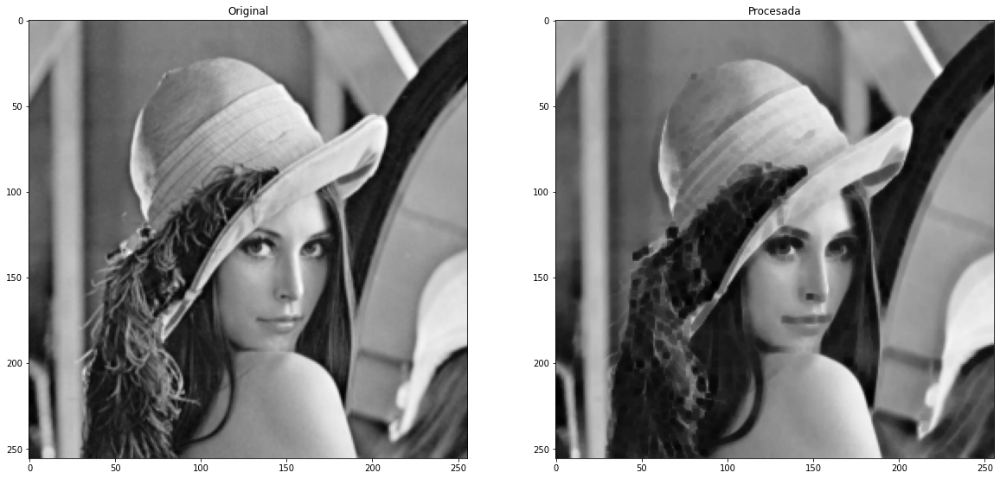

In [ ]:
#1. Erosion
gray_e_img=erosion(img_byn,1)
Graficar(img_byn,gray_e_img)

Dilatacion

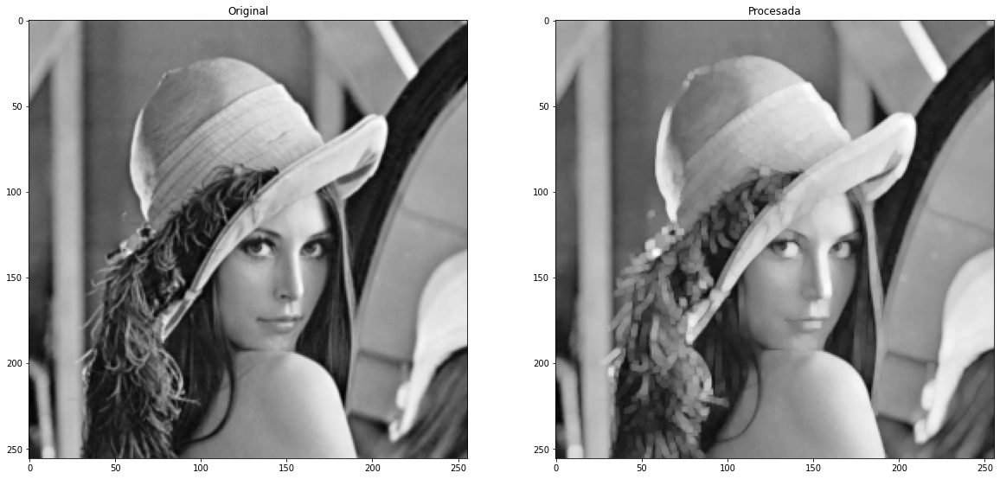

In [ ]:
#2. Dilatacion
d_gray_img=dilatacion(img_byn, 1)
Graficar(img_byn, d_gray_img)

Apertura

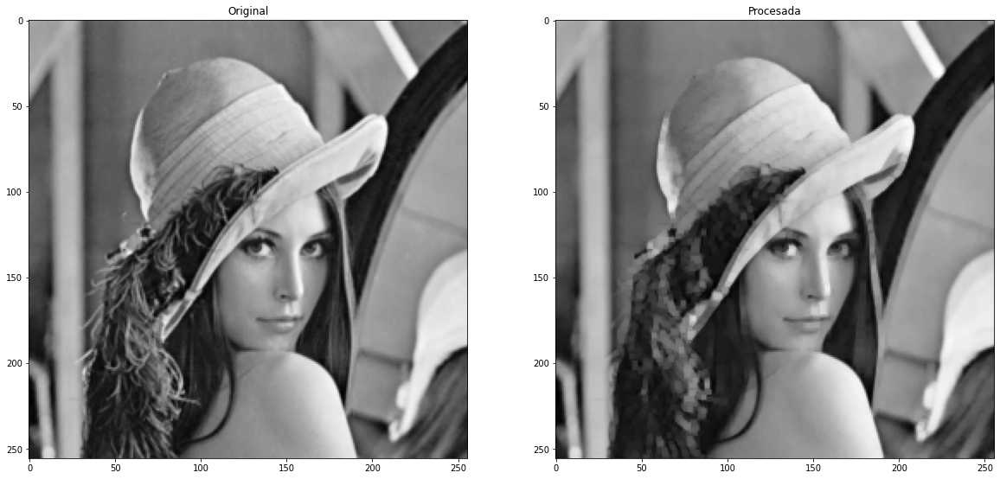

In [ ]:
#Apertura= erosión seguida por dilatación
ap_img=dilatacion(erosion(img_byn,1),1)
Graficar(img_byn, ap_img)

Cierre

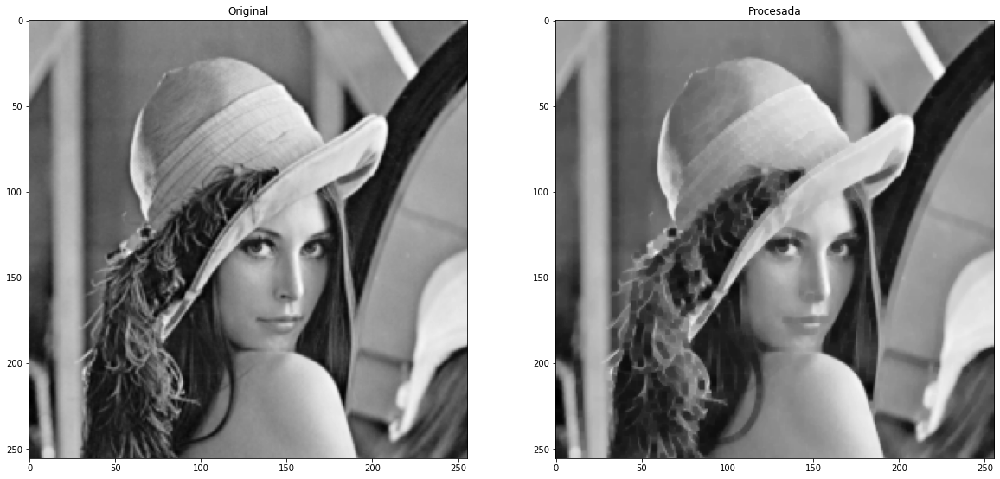

In [ ]:
#Cierre= dilatación seguida por erosión
ci_img=erosion(dilatacion(img_byn,1),1)
Graficar(img_byn, ci_img)

Borde exterior

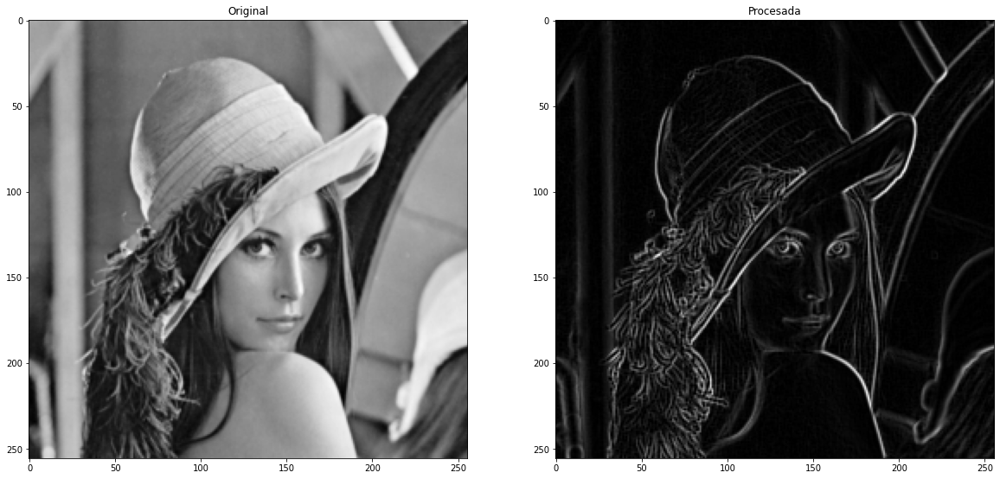

In [ ]:
#Borde exterior= dilatación menos original
borde_ext_img=d_gray_img-img_byn
#print(borde_ext_img)
Graficar(img_byn,borde_ext_img)

Borde interior

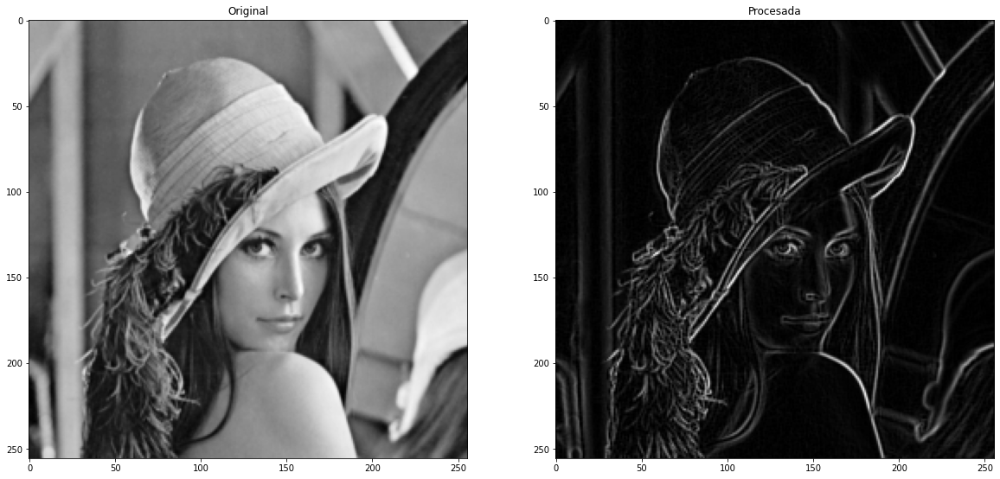

In [ ]:
#Borde interior= original menos erosión
borde_int_img=img_byn-erosion(img_byn,1)

Graficar(img_byn,borde_int_img)

Top hat

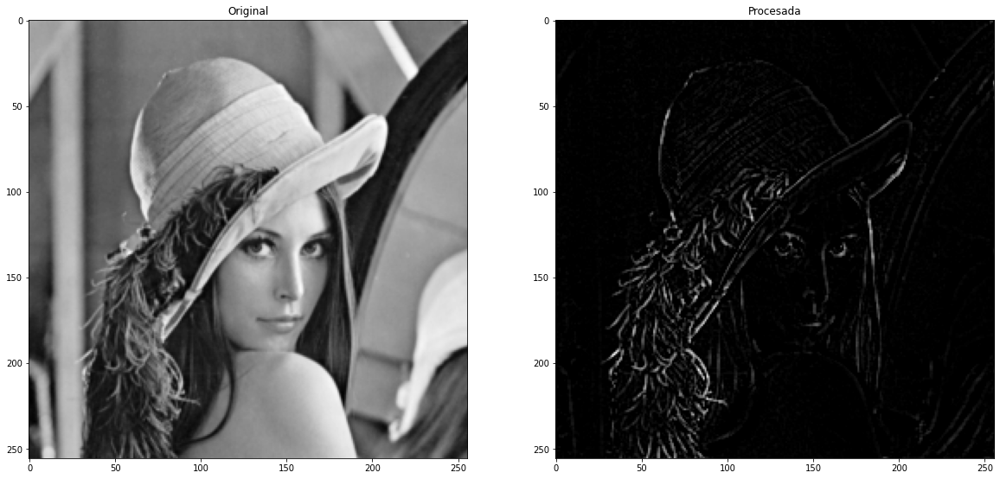

In [ ]:
#Top hat= imagen menos apertura
th_img=img_byn-ap_img
Graficar(img_byn, th_img)

Mediana

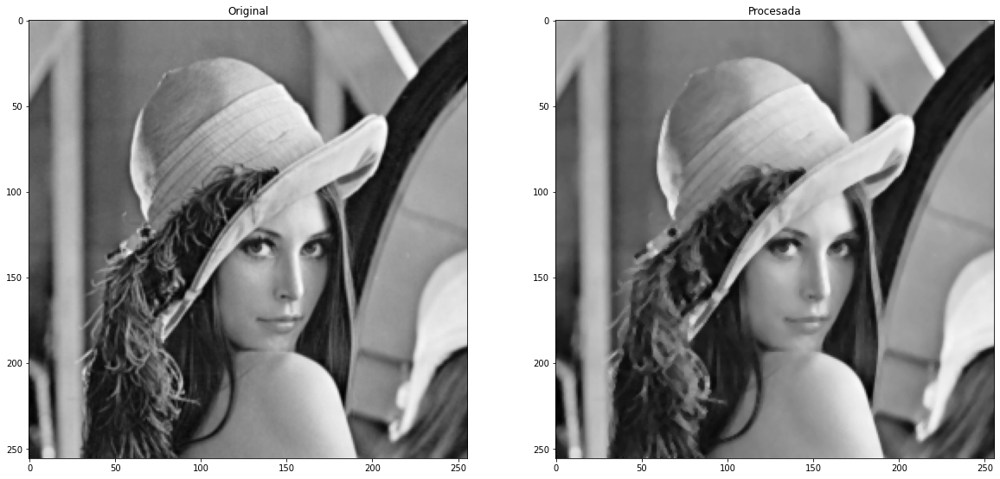

In [ ]:
med_img=mediana(img_byn)
Graficar(img_byn, med_img)

In [ ]:
variable_name = "erosion" #@param ["erosion", "dilatacion", "apertura"] {allow-input: true}
#@title String fields

if variable_name == 'Original':
  I_DOG = DOG(img_byn,10,1) # Filtrado con la imagen original
  Graficar(img_byn, I_DOG) #graficado
  
if variable_name == 'pasabajos':
          I_DOG2 = Barlett(I_DOG) #Filtrado pasabajos con Imagen procesada


#-fin- 

In [ ]:
from ipywidgets import widgets as wg

def get_widgets():
    filtros = wg.Dropdown(options=["erosion", "dilatacion", "apertura"],
                                    value='erosion',
                                    description='Filtros:',
                                    disabled=False)
    if filtros == 'erosion':
      e_img = erosion(img_byn,1) # Filtrado con la imagen original
      Graficar(img_byn,e_img)

    if filtros == 'dilatacion':
      d_img = dilatacion(img_byn,1) # Filtrado con la imagen original
      Graficar(img_byn,d_img) 
    
    if filtros == 'apertura':
      ap_img=dilatacion(erosion(img_byn,1),1)
      Graficar(img_byn, ap_img)
        
#if variable_name == 'pasabajos':
 #         I_DOG2 = Barlett(I_DOG) #Filtrado pasabajos con Imagen procesada

    return filtros

In [ ]:
get_widgets()

Dropdown(description='Filtros:', options=('erosion', 'dilatacion', 'apertura'), value='erosion')

In [ ]:
dilatacion=get_widgets